## Project- Solar Panel Failure Prediction Model


#### Data description

#### Importing the libraries

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from feature_engine.outliers import Winsorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn import set_config

from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import recall_score, precision_score, f1_score

import joblib
import pickle

import warnings 
warnings.filterwarnings('ignore')

In [25]:
# Connector for python programs to access MySQL databases

import mysql.connector

db = mysql.connector.connect(host="localhost", user="root", passwd="Sql@12345", database="solar")

sql_query = "select * from solar.Solar_Data"

df = pd.read_sql(sql_query,db)

df

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,1.517355,1.519348,101.635742,143.554688,0.475829,-0.127563,-0.348271,-149.619751,42.829437,112.323303,0.510124,50.135770,155.884140,50.000133,F
1,3.897243,2.147522,92.211914,148.242188,-0.188844,0.684814,-0.455693,15.128326,-140.181122,129.926809,0.712704,50.182075,155.676896,50.002804,F
2,1.718467,2.361328,85.137939,149.121094,0.502685,0.181274,-0.704106,-110.141449,-32.751923,152.127075,0.744162,50.127624,155.892236,50.014469,F
3,3.976782,2.178741,91.406250,147.363281,0.657104,-0.449829,-0.173711,-145.436859,120.604706,24.124959,0.714934,49.757674,155.176645,50.013787,F
4,8.655286,2.319702,87.243652,148.535156,0.764525,-0.496826,-0.328130,-154.971924,82.789917,76.397044,0.732174,50.181754,156.202529,50.006156,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.269902,1.447449,101.184082,142.968750,0.106566,-0.463257,0.316401,-35.415955,148.076782,-112.793427,0.459109,50.140063,154.788159,50.006475,NF
9996,13.753663,2.193878,90.484619,146.191406,-0.450685,-0.208130,0.591670,109.960632,38.646545,-149.326426,0.669946,50.057496,155.148004,50.006852,NF
9997,9.824058,2.246857,90.075684,148.535156,0.469115,0.214844,-0.744390,-93.000031,-55.414276,154.433492,0.725229,49.906745,155.622305,49.990048,NF
9998,2.659767,2.191986,89.941406,148.242188,0.596679,-0.537109,-0.126714,-140.024414,127.222595,13.255870,0.713121,49.904263,155.049839,49.998991,NF


In [26]:
# Gives the no. of rows & columns
df.shape

(10000, 15)

In [27]:
# Gives the names of the columns
df.columns

Index(['Time', 'Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc',
       'If', 'Vabc', 'Vf', 'label'],
      dtype='object')

In [28]:
 # Gives information about the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    10000 non-null  float64
 1   Ipv     10000 non-null  float64
 2   Vpv     10000 non-null  float64
 3   Vdc     10000 non-null  float64
 4   ia      10000 non-null  float64
 5   ib      10000 non-null  float64
 6   ic      10000 non-null  float64
 7   va      10000 non-null  float64
 8   vb      10000 non-null  float64
 9   vc      10000 non-null  float64
 10  Iabc    10000 non-null  float64
 11  If      10000 non-null  float64
 12  Vabc    10000 non-null  float64
 13  Vf      10000 non-null  float64
 14  label   10000 non-null  object 
dtypes: float64(14), object(1)
memory usage: 1.1+ MB


In [29]:
df.isnull().sum()

Time     0
Ipv      0
Vpv      0
Vdc      0
ia       0
ib       0
ic       0
va       0
vb       0
vc       0
Iabc     0
If       0
Vabc     0
Vf       0
label    0
dtype: int64

In [30]:
# Gives the first 5 rows of the dataset
df.head()

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,1.517355,1.519348,101.635742,143.554688,0.475829,-0.127563,-0.348271,-149.619751,42.829437,112.323303,0.510124,50.135770,155.884140,50.000133,F
1,3.897243,2.147522,92.211914,148.242188,-0.188844,0.684814,-0.455693,15.128326,-140.181122,129.926809,0.712704,50.182075,155.676896,50.002804,F
2,1.718467,2.361328,85.137939,149.121094,0.502685,0.181274,-0.704106,-110.141449,-32.751923,152.127075,0.744162,50.127624,155.892236,50.014469,F
3,3.976782,2.178741,91.406250,147.363281,0.657104,-0.449829,-0.173711,-145.436859,120.604706,24.124959,0.714934,49.757674,155.176645,50.013787,F
4,8.655286,2.319702,87.243652,148.535156,0.764525,-0.496826,-0.328130,-154.971924,82.789917,76.397044,0.732174,50.181754,156.202529,50.006156,F


In [31]:
# Gives descriptive statistics
df.describe()

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,6.940839,1.797386,89.582322,140.539658,0.088677,0.016829,-0.150880,-28.170238,10.854801,19.776059,0.566910,49.734458,155.030041,49.999535
std,4.075799,0.569773,21.190200,24.305442,0.468171,0.621671,0.482479,120.361553,97.274410,104.565173,0.477386,3.224314,6.470709,0.020114
min,0.000028,-0.562897,0.280762,0.878906,-2.135865,-0.825806,-5.141973,-159.624939,-154.164276,-159.849955,0.000003,0.005966,1.000000,49.492334
25%,3.465366,1.472046,87.561035,142.968750,-0.376832,-0.349121,-0.455693,-144.264565,-82.826080,-71.967036,0.462681,49.921336,155.049310,49.996577
50%,6.778886,1.795593,91.290283,144.433594,0.093139,-0.020142,-0.126714,-68.318558,31.190872,27.347514,0.501508,50.005302,155.313436,50.000089
75%,10.391540,2.264832,101.330566,147.070312,0.475829,0.295410,0.128413,110.695953,93.250160,117.415301,0.687212,50.100039,155.571188,50.003502
max,14.399064,2.957336,109.020996,246.093750,1.106933,6.438599,0.699092,158.817291,159.407959,158.969981,6.219856,51.862775,156.235254,50.349175


### Auto - EDA 

Auto - EDA is used to automate the tasks and save the time in Exploratory Data Analysis.

Pandas Profiling is a simple-to-use open source Python package for exploratory data analysis.

It produces a report of your dataframe in a variety of formats.

It can perform a quick data analysis.

In [32]:
# Pandas_Profiling - library for quick data summaries and correlation analysis

import pandas_profiling
from pandas_profiling import ProfileReport

Sample = ProfileReport(df,title='Solar_Panel.html',explorative=True)
Sample.to_file("Solar_Panel.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
# To see the Auto-EDA report
Sample

In [34]:
# Gives the first 5 rows of the dataset
df.head()

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,1.517355,1.519348,101.635742,143.554688,0.475829,-0.127563,-0.348271,-149.619751,42.829437,112.323303,0.510124,50.135770,155.884140,50.000133,F
1,3.897243,2.147522,92.211914,148.242188,-0.188844,0.684814,-0.455693,15.128326,-140.181122,129.926809,0.712704,50.182075,155.676896,50.002804,F
2,1.718467,2.361328,85.137939,149.121094,0.502685,0.181274,-0.704106,-110.141449,-32.751923,152.127075,0.744162,50.127624,155.892236,50.014469,F
3,3.976782,2.178741,91.406250,147.363281,0.657104,-0.449829,-0.173711,-145.436859,120.604706,24.124959,0.714934,49.757674,155.176645,50.013787,F
4,8.655286,2.319702,87.243652,148.535156,0.764525,-0.496826,-0.328130,-154.971924,82.789917,76.397044,0.732174,50.181754,156.202529,50.006156,F


In [35]:
# Dropping an irrelevant column
df = df.drop(["Time"], axis = 1)

In [36]:
# Gives the unique elements of an array
df['label'].unique()

array(['F', 'NF'], dtype=object)

In [37]:
# Counts the no. of values for each specific element
df['label'].value_counts()

F     7000
NF    3000
Name: label, dtype: int64

### EDA ( Exploratory Data Analytics )

EDA is applied to investigate the data and summarize the key insights.

It gives the basic understanding of the data, it’s distribution, null values and much more.

##### First Moment Business Decision - Measures of Central Tendency


In [38]:
# Mean
df.mean()

Ipv       1.797386
Vpv      89.582322
Vdc     140.539658
ia        0.088677
ib        0.016829
ic       -0.150880
va      -28.170238
vb       10.854801
vc       19.776059
Iabc      0.566910
If       49.734458
Vabc    155.030041
Vf       49.999535
dtype: float64

In [39]:
# Median
df.median()

Ipv       1.795593
Vpv      91.290283
Vdc     144.433594
ia        0.093139
ib       -0.020142
ic       -0.126714
va      -68.318558
vb       31.190872
vc       27.347514
Iabc      0.501508
If       50.005302
Vabc    155.313436
Vf       50.000089
dtype: float64

In [40]:
# Mode
df.mode()

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,1.484344,101.251221,143.554688,0.005858,-0.214844,-0.341558,-154.405365,-86.779938,-154.337056,1.0,50.0,1.0,50.0,F
1,NaN,101.287842,NaN,NaN,NaN,NaN,NaN,39.839935,-154.116058,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.516022,-153.256175,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119.326935,-152.910614,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,133.213654,-152.878469,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,133.406525,-152.850342,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,138.107758,-150.865377,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,138.143921,-149.989421,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-147.662913,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-144.874318,NaN,NaN,NaN,NaN,NaN


##### Second Moment Business Decision - Measures of Dispersion 

In [41]:
# Variance
df.var()

Ipv         0.324641
Vpv       449.024567
Vdc       590.754495
ia          0.219184
ib          0.386474
ic          0.232786
va      14486.903545
vb       9462.310810
vc      10933.875323
Iabc        0.227897
If         10.396200
Vabc       41.870079
Vf          0.000405
dtype: float64

In [42]:
# Standard Deviation  
df.std()

Ipv       0.569773
Vpv      21.190200
Vdc      24.305442
ia        0.468171
ib        0.621671
ic        0.482479
va      120.361553
vb       97.274410
vc      104.565173
Iabc      0.477386
If        3.224314
Vabc      6.470709
Vf        0.020114
dtype: float64

##### Third Moment Business Decision - Skewness


In [43]:
# Skewness 
df.skew()

Ipv     -1.199411
Vpv     -3.299023
Vdc     -4.509521
ia      -0.598954
ib       6.268913
ic      -3.555100
va       0.387208
vb      -0.202850
vc      -0.319373
Iabc    10.133051
If     -12.832686
Vabc   -23.269858
Vf      -7.990987
dtype: float64

##### Fourth Moment Business Decision - Kurtosis

In [44]:
# Kurtosis
df.kurt()

Ipv       2.125586
Vpv      10.924002
Vdc      25.108549
ia        0.654572
ib       60.563165
ic       29.526952
va       -1.521858
vb       -1.350360
vc       -1.262139
Iabc    117.703518
If      173.315623
Vabc    547.020431
Vf      185.488799
dtype: float64

### Data Visualization

It is the process of finding trends and correlations in our data by representing it pictorially. 

It graphically plots data and is an effective way to communicate inferences from data.

##### Histogram - To Visualise Distribution

<function matplotlib.pyplot.show(close=None, block=None)>

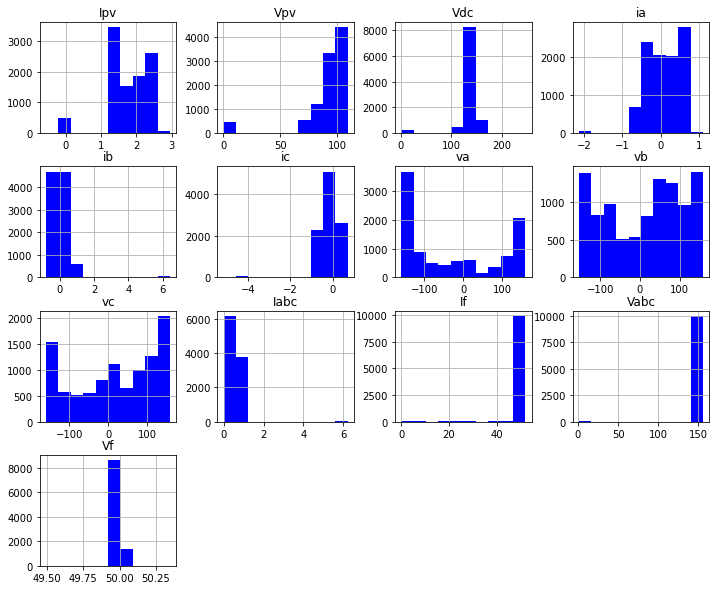

In [45]:
# Plots histogram for all the variables in the datset 

df.hist(bins = 10, figsize = (12,10), color='Blue')
plt.show

##### Count plot - Samples from each Fault class

To check the Balancing of our data 

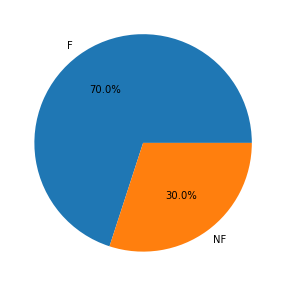

In [46]:
# Creates a pie chart

fig = plt.figure(1, figsize=(5,5))
plt.pie(df['label'].value_counts(),labels =df['label'].unique(),autopct='%2.1f%%')
plt.show()

##### Pair plot - Scatter plot between the variables along with histograms

It allows us to see both distribution of single variables and relationships between two variables.
It builds on two basic figures, the histogram and the scatter plot. The histogram on the diagonal allows us to see the distribution of a single variable while the scatter plots on the upper and lower triangles show the relationship between two variables.

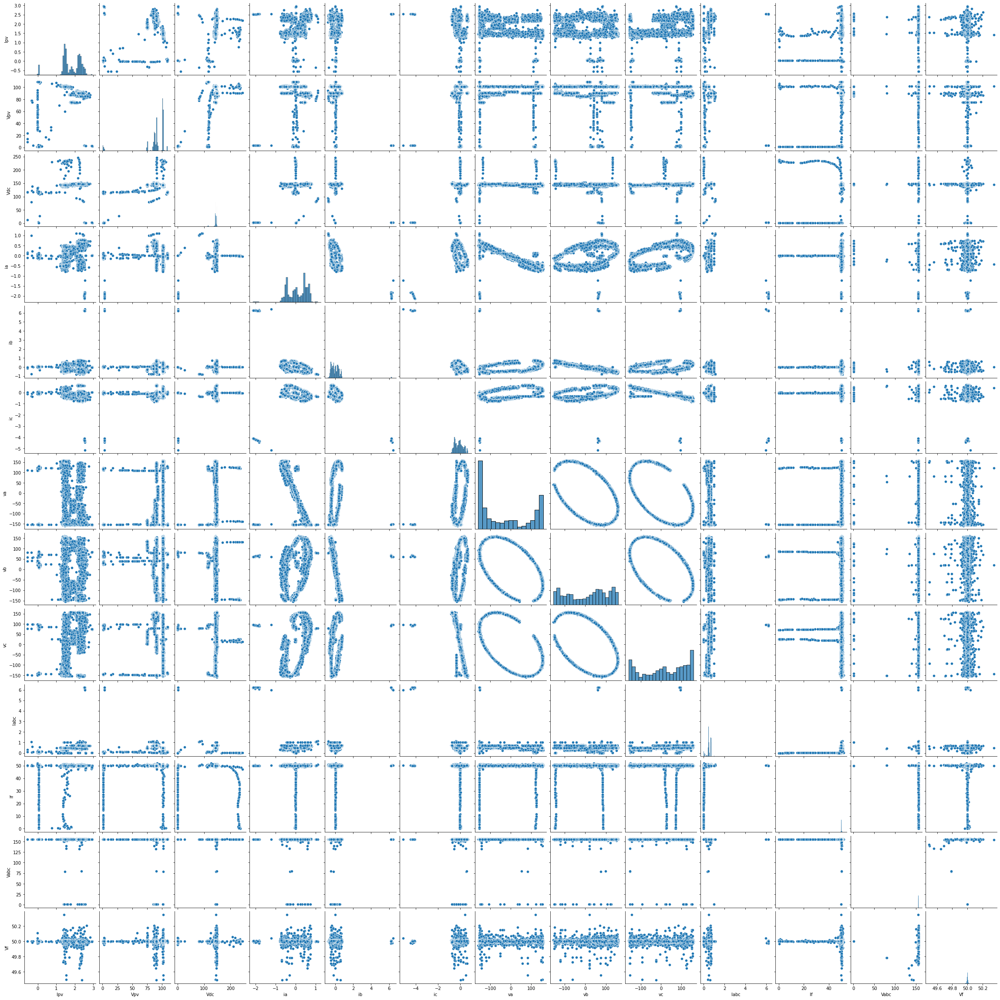

In [47]:
# Creates a pairplot
sns.pairplot(df.iloc[:, :])

##### Heatmap - Gives graphical representation of correlation coefficient between variables

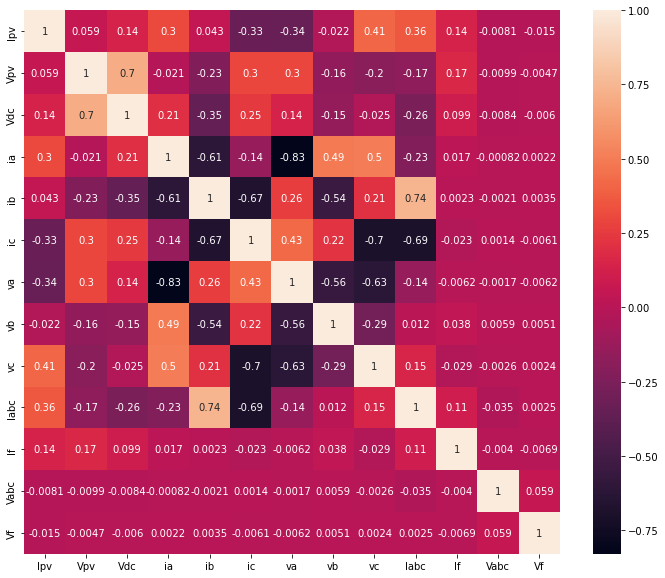

In [48]:
# Creates a heatmap

plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),annot=True)
plt.show()

##### Correlation matrix - Gives correlation coefficient between all the variables

In [49]:
# Gives correlation matrix

df.corr()

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
Ipv,1.000000,0.058973,0.141434,0.303585,0.043359,-0.334479,-0.340018,-0.022174,0.412796,0.357088,0.137860,-0.008079,-0.014933
Vpv,0.058973,1.000000,0.703513,-0.021290,-0.231727,0.296673,0.298636,-0.160081,-0.196784,-0.169230,0.170286,-0.009942,-0.004688
Vdc,0.141434,0.703513,1.000000,0.205936,-0.352466,0.248348,0.140133,-0.146787,-0.024916,-0.257205,0.098975,-0.008429,-0.006003
ia,0.303585,-0.021290,0.205936,1.000000,-0.610102,-0.138944,-0.829306,0.488884,0.500657,-0.227437,0.016788,-0.000818,0.002206
ib,0.043359,-0.231727,-0.352466,-0.610102,1.000000,-0.666993,0.262342,-0.544967,0.209463,0.735644,0.002278,-0.002132,0.003474
ic,-0.334479,0.296673,0.248348,-0.138944,-0.666993,1.000000,0.426321,0.218155,-0.700407,-0.694622,-0.022836,0.001363,-0.006147
va,-0.340018,0.298636,0.140133,-0.829306,0.262342,0.426321,1.000000,-0.563290,-0.628420,-0.140616,-0.006208,-0.001714,-0.006208
vb,-0.022174,-0.160081,-0.146787,0.488884,-0.544967,0.218155,-0.563290,1.000000,-0.288373,0.012006,0.038339,0.005932,0.005150
vc,0.412796,-0.196784,-0.024916,0.500657,0.209463,-0.700407,-0.628420,-0.288373,1.000000,0.151938,-0.028921,-0.002571,0.002381
Iabc,0.357088,-0.169230,-0.257205,-0.227437,0.735644,-0.694622,-0.140616,0.012006,0.151938,1.000000,0.106212,-0.035338,0.002493


##### Boxplot - Shows the distribution of data points across a selected measure

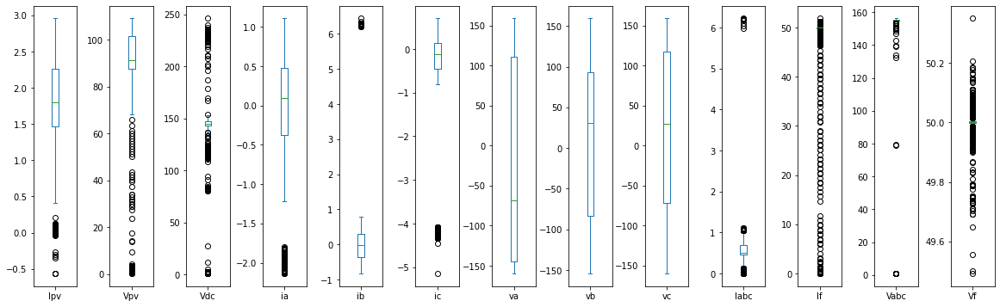

In [50]:
# Gives the multiple boxplots in a single visualization

df.plot(kind = 'box', subplots = True, sharey = False, figsize = (20, 6)) 
plt.subplots_adjust(wspace = 0.75) 
plt.show()

### Data - Preprocessing

It is a technique that is used to convert the raw data into a clean data set.
Pre-processing refers to the transformations applied to the data before feeding it to the algorithm.
For achieving better results from the applied model, the format of the data has to be in a proper manner.

##### Outlier Treatment - To treat outliers

In [51]:
# Creating a new variable
new_df = df  
new_df

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,1.519348,101.635742,143.554688,0.475829,-0.127563,-0.348271,-149.619751,42.829437,112.323303,0.510124,50.135770,155.884140,50.000133,F
1,2.147522,92.211914,148.242188,-0.188844,0.684814,-0.455693,15.128326,-140.181122,129.926809,0.712704,50.182075,155.676896,50.002804,F
2,2.361328,85.137939,149.121094,0.502685,0.181274,-0.704106,-110.141449,-32.751923,152.127075,0.744162,50.127624,155.892236,50.014469,F
3,2.178741,91.406250,147.363281,0.657104,-0.449829,-0.173711,-145.436859,120.604706,24.124959,0.714934,49.757674,155.176645,50.013787,F
4,2.319702,87.243652,148.535156,0.764525,-0.496826,-0.328130,-154.971924,82.789917,76.397044,0.732174,50.181754,156.202529,50.006156,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.447449,101.184082,142.968750,0.106566,-0.463257,0.316401,-35.415955,148.076782,-112.793427,0.459109,50.140063,154.788159,50.006475,NF
9996,2.193878,90.484619,146.191406,-0.450685,-0.208130,0.591670,109.960632,38.646545,-149.326426,0.669946,50.057496,155.148004,50.006852,NF
9997,2.246857,90.075684,148.535156,0.469115,0.214844,-0.744390,-93.000031,-55.414276,154.433492,0.725229,49.906745,155.622305,49.990048,NF
9998,2.191986,89.941406,148.242188,0.596679,-0.537109,-0.126714,-140.024414,127.222595,13.255870,0.713121,49.904263,155.049839,49.998991,NF


In [52]:
# Storing a winsorizer function in a pipeline

pipe1 = Pipeline([("winsor",Winsorizer(capping_method = 'iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail = 'both', # cap left, right or both tails 
                          fold = 1.5,
                          variables = ['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc','Iabc', 'If', 'Vabc', 'Vf']))])

In [53]:
outlier = pipe1.fit(new_df[['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc', 'If', 'Vabc', 'Vf']])

In [54]:
# Saves the winsorizer process 

joblib.dump(outlier, "Winsorizer")

['Winsorizer']

In [55]:
# Transforming a cleaned data to the dataset

new_df[['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc', 'If', 'Vabc', 'Vf']] = outlier.transform(new_df[['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc','Iabc', 'If', 'Vabc', 'Vf']])


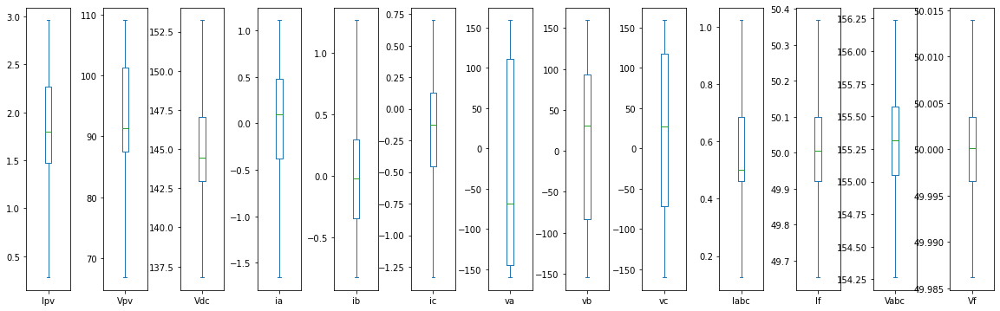

In [56]:
# Gives the multiple boxplots in a single visualization

new_df.plot(kind = 'box', subplots = True, sharey = False, figsize = (20, 6)) 
plt.subplots_adjust(wspace = 0.75)
plt.show()

In [57]:
# Default configuration for displaying a pipeline

set_config(display="diagram")

In [58]:
pipe1

Pipeline(steps=[('winsor',
                 Winsorizer(capping_method='iqr', fold=1.5, tail='both',
                            variables=['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic',
                                       'va', 'vb', 'vc', 'Iabc', 'If', 'Vabc',
                                       'Vf']))])

##### Missing values - To find missing values

In [59]:
missing = new_df.isna().sum()
missing

Ipv      0
Vpv      0
Vdc      0
ia       0
ib       0
ic       0
va       0
vb       0
vc       0
Iabc     0
If       0
Vabc     0
Vf       0
label    0
dtype: int64

In [60]:
# Saves the missing values process 
joblib.dump(missing, "isna()")

['isna()']

##### Duplication - To find duplicates

In [61]:
dup = new_df.duplicated().sum()
dup

0

In [62]:
# Saves the dup values process 
joblib.dump(dup, "duplicated().sum()")

['duplicated().sum()']

##### Splitting the data into Numerical & Categorical columns

In [63]:
# Storing the numerical features

X = new_df.iloc[:, :13]     # Predictors
X

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
0,1.519348,101.635742,143.554688,0.475829,-0.127563,-0.348271,-149.619751,42.829437,112.323303,0.510124,50.135770,155.884140,50.000133
1,2.147522,92.211914,148.242188,-0.188844,0.684814,-0.455693,15.128326,-140.181122,129.926809,0.712704,50.182075,155.676896,50.002804
2,2.361328,85.137939,149.121094,0.502685,0.181274,-0.704106,-110.141449,-32.751923,152.127075,0.744162,50.127624,155.892236,50.013891
3,2.178741,91.406250,147.363281,0.657104,-0.449829,-0.173711,-145.436859,120.604706,24.124959,0.714934,49.757674,155.176645,50.013787
4,2.319702,87.243652,148.535156,0.764525,-0.496826,-0.328130,-154.971924,82.789917,76.397044,0.732174,50.181754,156.202529,50.006156
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.447449,101.184082,142.968750,0.106566,-0.463257,0.316401,-35.415955,148.076782,-112.793427,0.459109,50.140063,154.788159,50.006475
9996,2.193878,90.484619,146.191406,-0.450685,-0.208130,0.591670,109.960632,38.646545,-149.326426,0.669946,50.057496,155.148004,50.006852
9997,2.246857,90.075684,148.535156,0.469115,0.214844,-0.744390,-93.000031,-55.414276,154.433492,0.725229,49.906745,155.622305,49.990048
9998,2.191986,89.941406,148.242188,0.596679,-0.537109,-0.126714,-140.024414,127.222595,13.255870,0.713121,49.904263,155.049839,49.998991


In [64]:
# Storing the categorical feature

Y = new_df.iloc[:, 13:]       # Target
Y

,label
0,F
1,F
2,F
3,F
4,F
...,...
9995,NF
9996,NF
9997,NF
9998,NF


##### Separating Numerical and Categorical columns

In [65]:
# Gives column names of from X set

numerical = X.select_dtypes(exclude = ['object']).columns
numerical

Index(['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc', 'If',
       'Vabc', 'Vf'],
      dtype='object')

In [66]:
# Gives column names of from Y set 

categorical = Y.select_dtypes(include = ['object']).columns
categorical

Index(['label'], dtype='object')

##### MinMaxScaler - To convert the magnitude of the columns to a range of 0 to 1

In [67]:
# Storing a MinMaxScaler function in a pipeline

pipe2 = Pipeline([("scale", MinMaxScaler())])

In [68]:
scale_trans = ColumnTransformer([("scale", pipe2, numerical)])

In [69]:
scale = scale_trans.fit(new_df)

In [70]:
# Save the MinMaxScaler Model
joblib.dump(scale, 'minmax')

['minmax']

In [71]:
# Transforming a scaled data to the dataset

new_df[numerical] = pd.DataFrame(scale.transform(new_df[numerical]))
new_df[numerical]

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
0,0.462328,0.824638,0.410714,0.771567,0.334405,0.484298,0.031419,0.628224,0.853690,0.427825,0.674986,0.821657,0.503376
1,0.697206,0.600870,0.696429,0.530984,0.723473,0.431405,0.548775,0.044593,0.908904,0.653383,0.739766,0.716391,0.599804
2,0.777149,0.432899,0.750000,0.781288,0.482315,0.309091,0.155392,0.387191,0.978537,0.688409,0.663591,0.825770,1.000000
3,0.708879,0.581739,0.642857,0.837181,0.180064,0.570248,0.044555,0.876254,0.577050,0.655866,0.146042,0.462297,0.996265
4,0.761585,0.482899,0.714286,0.876063,0.157556,0.494215,0.014612,0.755661,0.741004,0.675062,0.739317,0.983378,0.720800
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.435444,0.813913,0.375000,0.637910,0.173633,0.811570,0.390052,0.963864,0.147596,0.371023,0.680993,0.264971,0.732321
9996,0.714538,0.559855,0.571429,0.436209,0.295820,0.947107,0.846576,0.614885,0.033008,0.605776,0.565484,0.447749,0.745908
9997,0.734347,0.550145,0.714286,0.769137,0.498392,0.289256,0.209221,0.314919,0.985771,0.667329,0.354587,0.688663,0.139341
9998,0.713831,0.546957,0.696429,0.815310,0.138264,0.593388,0.061551,0.897359,0.542958,0.653847,0.351115,0.397888,0.462148


In [72]:
pipe2

Pipeline(steps=[('scale', MinMaxScaler())])

In [73]:
# Combining the Pipelines

pipe = Pipeline([("winsor",Winsorizer(capping_method = 'iqr', tail = 'both', fold = 1.5, variables = ['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc','Iabc', 'If', 'Vabc', 'Vf'])),
                ("scale", MinMaxScaler())])

In [74]:
pipe

Pipeline(steps=[('winsor',
                 Winsorizer(capping_method='iqr', fold=1.5, tail='both',
                            variables=['Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic',
                                       'va', 'vb', 'vc', 'Iabc', 'If', 'Vabc',
                                       'Vf'])),
                ('scale', MinMaxScaler())])

##### Dummy Variables - Label Encoding

In [75]:
# Creating instance of labelencoder

labelencoder = LabelEncoder()

new_df['label'] = labelencoder.fit_transform(new_df['label'])
new_df['label']

0       0
1       0
2       0
3       0
4       0
       ..
9995    1
9996    1
9997    1
9998    1
9999    1
Name: label, Length: 10000, dtype: int32

In [76]:
# Save the Encoding model
joblib.dump(labelencoder,'LabelEncoder')

['LabelEncoder']

In [77]:
new_df

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,0.462328,0.824638,0.410714,0.771567,0.334405,0.484298,0.031419,0.628224,0.853690,0.427825,0.674986,0.821657,0.503376,0
1,0.697206,0.600870,0.696429,0.530984,0.723473,0.431405,0.548775,0.044593,0.908904,0.653383,0.739766,0.716391,0.599804,0
2,0.777149,0.432899,0.750000,0.781288,0.482315,0.309091,0.155392,0.387191,0.978537,0.688409,0.663591,0.825770,1.000000,0
3,0.708879,0.581739,0.642857,0.837181,0.180064,0.570248,0.044555,0.876254,0.577050,0.655866,0.146042,0.462297,0.996265,0
4,0.761585,0.482899,0.714286,0.876063,0.157556,0.494215,0.014612,0.755661,0.741004,0.675062,0.739317,0.983378,0.720800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.435444,0.813913,0.375000,0.637910,0.173633,0.811570,0.390052,0.963864,0.147596,0.371023,0.680993,0.264971,0.732321,1
9996,0.714538,0.559855,0.571429,0.436209,0.295820,0.947107,0.846576,0.614885,0.033008,0.605776,0.565484,0.447749,0.745908,1
9997,0.734347,0.550145,0.714286,0.769137,0.498392,0.289256,0.209221,0.314919,0.985771,0.667329,0.354587,0.688663,0.139341,1
9998,0.713831,0.546957,0.696429,0.815310,0.138264,0.593388,0.061551,0.897359,0.542958,0.653847,0.351115,0.397888,0.462148,1


### Model building 

Building a model is creating a mathematical representation by generalizing and learning from training data.
Then, the built model is applied to new data to make predictions and obtain results.

###### Splitting data for train & test split

In [78]:
# Storing the predictors
X = new_df.iloc[:, :13]     # Predictors
X

,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
0,0.462328,0.824638,0.410714,0.771567,0.334405,0.484298,0.031419,0.628224,0.853690,0.427825,0.674986,0.821657,0.503376
1,0.697206,0.600870,0.696429,0.530984,0.723473,0.431405,0.548775,0.044593,0.908904,0.653383,0.739766,0.716391,0.599804
2,0.777149,0.432899,0.750000,0.781288,0.482315,0.309091,0.155392,0.387191,0.978537,0.688409,0.663591,0.825770,1.000000
3,0.708879,0.581739,0.642857,0.837181,0.180064,0.570248,0.044555,0.876254,0.577050,0.655866,0.146042,0.462297,0.996265
4,0.761585,0.482899,0.714286,0.876063,0.157556,0.494215,0.014612,0.755661,0.741004,0.675062,0.739317,0.983378,0.720800
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.435444,0.813913,0.375000,0.637910,0.173633,0.811570,0.390052,0.963864,0.147596,0.371023,0.680993,0.264971,0.732321
9996,0.714538,0.559855,0.571429,0.436209,0.295820,0.947107,0.846576,0.614885,0.033008,0.605776,0.565484,0.447749,0.745908
9997,0.734347,0.550145,0.714286,0.769137,0.498392,0.289256,0.209221,0.314919,0.985771,0.667329,0.354587,0.688663,0.139341
9998,0.713831,0.546957,0.696429,0.815310,0.138264,0.593388,0.061551,0.897359,0.542958,0.653847,0.351115,0.397888,0.462148


In [79]:
# Storing a target
Y = new_df.label       # Target
Y

0       0
1       0
2       0
3       0
4       0
       ..
9995    1
9996    1
9997    1
9998    1
9999    1
Name: label, Length: 10000, dtype: int32

In [80]:
# Split the dataset into training (70%) and testing (30%) sets
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=0, shuffle=True)

##### AutoML 

AutoML provides automatic exploratory data analysis for the train data frame which is used to initialize AutoML.

FLAML stands for Fast and Lightweight Auto ML Python library that finds accurate machine learning models automatically, efficiently and economically.

This library, the user does not need to select learners and tune hyperparameters for better accuracy—this library executes all these tasks automatically and provides the result with the best accuracy.

In [81]:
from flaml import AutoML
automl = AutoML()
from flaml.automl.data import CLASSIFICATION

In [82]:
automl.fit(X_train, Y_train, task = 'classification', estimator_list = ['rf','kneighbor'])

[flaml.automl.automl: 02-15 11:49:25] {2716} INFO - task = classification
[flaml.automl.automl: 02-15 11:49:25] {2718} INFO - Data split method: stratified
[flaml.automl.automl: 02-15 11:49:25] {2721} INFO - Evaluation method: cv
[flaml.automl.automl: 02-15 11:49:25] {2848} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.automl: 02-15 11:49:25] {2898} WARNING - No search budget is provided via time_budget or max_iter. Training only one model per estimator. Zero-shot AutoML is used for certain tasks and estimators. To tune hyperparameters for each estimator, please provide budget either via time_budget or max_iter.
[flaml.automl.automl: 02-15 11:49:25] {2994} INFO - List of ML learners in AutoML Run: ['rf', 'kneighbor']
[flaml.automl.automl: 02-15 11:49:25] {3323} INFO - iteration 0, current learner rf
[flaml.automl.automl: 02-15 11:49:32] {3461} INFO - Estimated sufficient time budget=10000s. Estimated necessary time budget=10s.
[flaml.automl.automl: 02-15 11:49:32] {3508} INFO

In [63]:
print(automl.model)

In [83]:
Y_test_pred = automl.predict(X_test)
Y_test_pred

array([1, 0, 0, ..., 1, 1, 0])

In [84]:
Y_train_pred = automl.predict(X_train)
Y_train_pred

array([1, 1, 0, ..., 0, 1, 0])

In [86]:
print(accuracy_score(Y_train, Y_train_pred))

1.0


In [87]:
print(accuracy_score(Y_test, Y_test_pred))

0.9933333333333333


In [88]:
# From AutoMl Random Forest Classifier is the best model

pickle.dump(RandomForestClassifier, open("model2.pkl","wb"))

##### Model building 

In [89]:
def print_score(clf, X_train, y_train, X_test, Y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(Y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(Y_train, pred)}")
        print("_______________________________________________")
        cm = confusion_matrix(Y_train, pred)
        print(f"Sensitivity: {cm[0,0]/(cm[0,0]+cm[0,1]):.2f}")
        print(f"Specificity: {cm[1,1]/(cm[1,0]+cm[1,1]):.2f}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(Y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(Y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(Y_test, pred)}")
        print("_______________________________________________")
        cm1 = confusion_matrix(Y_test, pred)
        print(f"Sensitivity: {cm1[0,0]/(cm1[0,0]+cm1[0,1]):.2f}")
        print(f"Specificity: {cm1[1,1]/(cm1[1,0]+cm1[1,1]):.2f}\n")
        
# Sensitivity = TP/(TP+FN)
# Specificity = TN/(TN+FP)

#### Logistic regression 

It is an example of supervised learning.
It is used to calculate or predict the probability of a binary event occurring.
Here, it can be used to predict if a solar panel is likely to be faulty or non - faulty.

In [90]:
# Create a Logistic Regression Classifier
lr_clf = LogisticRegression(C=1, solver='liblinear')

lr_clf.fit(X_train, Y_train)

print_score(lr_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(lr_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 80.74%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.827350     0.739975  0.807429     0.783663      0.800963
recall        0.915063     0.558657  0.807429     0.736860      0.807429
f1-score      0.868999     0.636658  0.807429     0.752828      0.798832
support    4886.000000  2114.000000  0.807429  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4471  415]
 [ 933 1181]]
_______________________________________________
Sensitivity: 0.92
Specificity: 0.56

Test Result:
Accuracy Score: 80.57%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.829247    0.724444  0.805667     0.776846      0.798296
recall        0.912015    0.551919  0.805667     0.731967      0.805667
f1-score      0.868664  

##### Hyperparameter tuning

It has the ability to drastically improve the accuracy of your model, just like model selection or feature selection.

In [91]:
para = {'C': np.logspace(0, 4, num=10), 'solver':['liblinear','newton-cg' 'lbfgs', 'sag', 'saga']}

lr_clf_cv = GridSearchCV(LogisticRegression(), para)

lr_clf_cv.fit(X_train, Y_train)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
       5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
       3.59381366e+03, 1.00000000e+04]),
                         'solver': ['liblinear', 'newton-cglbfgs', 'sag',
                                    'saga']})

In [92]:
print(lr_clf_cv.best_estimator_)

LogisticRegression(C=10000.0, solver='liblinear')


In [93]:
# Model with best parameter values
lr_best = lr_clf_cv.best_estimator_
lr_best

LogisticRegression(C=10000.0, solver='liblinear')

##### Model Evaluation

Model evaluation is the process of checking the model performance to see how much our model is able to explain the data.

In [94]:
lr_clf_par = LogisticRegression( C=10000.0, solver='liblinear')

lr_clf_par.fit(X_train, Y_train)

print_score(lr_clf_par, X_train, Y_train, X_test, Y_test, train=True)
print_score(lr_clf_par, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 85.40%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.883486     0.778287     0.854     0.830886      0.851716
recall        0.910970     0.722327     0.854     0.816649      0.854000
f1-score      0.897017     0.749264     0.854     0.823141      0.852396
support    4886.000000  2114.000000     0.854  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4451  435]
 [ 587 1527]]
_______________________________________________
Sensitivity: 0.91
Specificity: 0.72

Test Result:
Accuracy Score: 84.23%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.876895    0.750911  0.842333     0.813903      0.839688
recall        0.903027    0.697517  0.842333     0.800272      0.842333
f1-score      0.889769  

##### SVM  (Support Vector Machine)

SVM (Support Vector Machine) is a supervised and linear Machine Learning algorithm
Most commonly used for solving classification problems and is also referred to as SVC (Support Vector Classification).

In [95]:
# Create a SVM Classifier
svm_clf = svm.SVC(kernel='linear')

svm_clf.fit(X_train, Y_train)

print_score(svm_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(svm_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 82.67%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.846706     0.764533  0.826714     0.805619      0.821890
recall        0.917929     0.615894  0.826714     0.766911      0.826714
f1-score      0.880880     0.682211  0.826714     0.781546      0.820882
support    4886.000000  2114.000000  0.826714  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4485  401]
 [ 812 1302]]
_______________________________________________
Sensitivity: 0.92
Specificity: 0.62

Test Result:
Accuracy Score: 82.13%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.845749    0.743733  0.821333     0.794741      0.815620
recall        0.912961    0.602709  0.821333     0.757835      0.821333
f1-score      0.878071  

In [96]:
  #Train Accuracy Score: 82.67%
  #Test Accuracy Score: 82.13%

##### Hyperparameter tuning 

In [97]:
para = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],'kernel': ['rbf']}

svm_clf_cv = GridSearchCV(svm.SVC(), para)

svm_clf_cv.fit(X_train, Y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [98]:
print(svm_clf_cv.best_estimator_)

SVC(C=1000, gamma=1)


In [99]:
# Model with best parameter values
svm_best = svm_clf_cv.best_estimator_
svm_best

SVC(C=1000, gamma=1)

##### Model Evaluation 

In [100]:
svm_clf_par = svm.SVC(C=1000, gamma=1)

svm_clf_par.fit(X_train, Y_train)

print_score(svm_clf_par, X_train, Y_train, X_test, Y_test, train=True)
print_score(svm_clf_par, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 99.90%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.999386     0.998109     0.999     0.998747         0.999
recall        0.999181     0.998581     0.999     0.998881         0.999
f1-score      0.999284     0.998345     0.999     0.998814         0.999
support    4886.000000  2114.000000     0.999  7000.000000      7000.000
_______________________________________________
Confusion Matrix: 
 [[4882    4]
 [   3 2111]]
_______________________________________________
Sensitivity: 1.00
Specificity: 1.00

Test Result:
Accuracy Score: 98.93%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.991038    0.985227  0.989333     0.988133      0.989322
recall        0.993851    0.978555  0.989333     0.986203      0.989333
f1-score      0.992442  

In [101]:
  #Train Accuracy Score: 99.90%
  #Test Accuracy Score: 98.93%

##### KNN  (K-Nearest Neighbour)

K-Nearest Neighbour is one of the simplest ML algorithm based on Supervised Learning technique.
K-NN algorithm stores all the available data and classifies a new data point based on the similarity.

In [102]:
# Create a KNN Classifier

knn_clf = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2 )

knn_clf.fit(X_train, Y_train)

print_score(knn_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(knn_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 98.29%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.990128     0.966324  0.982857     0.978226      0.982939
recall        0.985264     0.977294  0.982857     0.981279      0.982857
f1-score      0.987690     0.971778  0.982857     0.979734      0.982884
support    4886.000000  2114.000000  0.982857  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4814   72]
 [  48 2066]]
_______________________________________________
Sensitivity: 0.99
Specificity: 0.98

Test Result:
Accuracy Score: 97.03%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.980085    0.947250  0.970333     0.963668      0.970388
recall        0.977767    0.952596  0.970333     0.965182      0.970333
f1-score      0.978925  

In [103]:
  #Train Accuracy Score: 99.90%
  #Test Accuracy Score: 98.93%

In [104]:
k_range = list(range(1, 31))
para = dict(n_neighbors=k_range)

knn_clf_cv = GridSearchCV( KNeighborsClassifier(), para, cv=10, scoring='accuracy', return_train_score=False,verbose=1)

knn_clf_cv.fit(X_train, Y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30]},
             scoring='accuracy', verbose=1)

In [105]:
# The best set of parameter values
knn_clf_cv.best_params_

{'n_neighbors': 6}

In [106]:
# Model with best parameter values
knn_best = knn_clf_cv.best_estimator_
knn_best

KNeighborsClassifier(n_neighbors=6)

##### Model Evaluation

In [107]:
# Create a KNN Classifier

knn_clf = KNeighborsClassifier(n_neighbors=6, metric='minkowski', p=2 )

knn_clf.fit(X_train, Y_train)

print_score(knn_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(knn_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 97.97%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.982702     0.972675  0.979714     0.977689      0.979674
recall        0.988334     0.959792  0.979714     0.974063      0.979714
f1-score      0.985510     0.966190  0.979714     0.975850      0.979676
support    4886.000000  2114.000000  0.979714  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4829   57]
 [  85 2029]]
_______________________________________________
Sensitivity: 0.99
Specificity: 0.96

Test Result:
Accuracy Score: 96.93%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.974648    0.956322  0.969333     0.965485      0.969236
recall        0.982025    0.939052  0.969333     0.960538      0.969333
f1-score      0.978322  

In [108]:
  #Train Accuracy Score: 97.97%
  #Test Accuracy Score: 96.93%

#### Decision Tree

It belongs to the family of supervised learning algorithms. 
The goal of using a Decision Tree is to create a training model that can use to predict the class or value of the target variable.

In [109]:
# Create a Decision Tree Classifier Classifier
dt_clf = DecisionTreeClassifier(criterion = 'entropy')

dt_clf.fit(X_train, Y_train)

print_score(dt_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(dt_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
                0       1  accuracy  macro avg  weighted avg
precision     1.0     1.0       1.0        1.0           1.0
recall        1.0     1.0       1.0        1.0           1.0
f1-score      1.0     1.0       1.0        1.0           1.0
support    4886.0  2114.0       1.0     7000.0        7000.0
_______________________________________________
Confusion Matrix: 
 [[4886    0]
 [   0 2114]]
_______________________________________________
Sensitivity: 1.00
Specificity: 1.00

Test Result:
Accuracy Score: 97.53%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.981586    0.960317  0.975333     0.970952      0.975305
recall        0.983444    0.955982  0.975333     0.969713      0.975333
f1-score      0.982514    0.958145  0.975333     0.970329      0.975317
support    

##### Hyperparameter tuning

In [110]:
para = { 'criterion':['gini','entropy'], 'max_depth': np.arange(3, 15)}

dt_clf_cv = GridSearchCV( DecisionTreeClassifier(), para, cv = 5, scoring='accuracy', return_train_score=False, verbose=1)

dt_clf_cv.fit(X_train, Y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])},
             scoring='accuracy', verbose=1)

In [111]:
# The best set of parameter values
dt_clf_cv.best_params_

{'criterion': 'gini', 'max_depth': 13}

In [112]:
# Model with best parameter values
dt_best = dt_clf_cv.best_estimator_
dt_best

DecisionTreeClassifier(max_depth=13)

##### Model Evaluation

In [113]:
dt_clf_par = DecisionTreeClassifier(criterion = 'entropy', max_depth=12) 

dt_clf_par.fit(X_train, Y_train)

print_score(dt_clf_par, X_train, Y_train, X_test, Y_test, train=True)
print_score(dt_clf_par, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 99.56%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.997540     0.991042  0.995571     0.994291      0.995578
recall        0.996111     0.994324  0.995571     0.995217      0.995571
f1-score      0.996825     0.992680  0.995571     0.994753      0.995574
support    4886.000000  2114.000000  0.995571  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4867   19]
 [  12 2102]]
_______________________________________________
Sensitivity: 1.00
Specificity: 0.99

Test Result:
Accuracy Score: 97.60%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.983428    0.958333     0.976     0.970881      0.976017
recall        0.982498    0.960497     0.976     0.971497      0.976000
f1-score      0.982963  

##### RandomForestClassifier

It belongs to the supervised learning technique.
It is based on the concept of ensemble learning, which is a process of combining multiple classifiers to solve a complex problem and to improve the performance of the model.
It is used for both classification and regression —for example, classifying whether an solar panel is faulty or non-faulty.
It takes less training time as compared to other algorithms and predicts output with high accuracy, even for the large dataset it runs efficiently.

In [114]:
rf_clf = RandomForestClassifier(criterion = "gini", random_state = 20, max_depth=5, min_samples_leaf=5)
rf_clf.fit(X_train, Y_train)

print_score(rf_clf, X_train, Y_train, X_test, Y_test, train=True)
print_score(rf_clf, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 96.16%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.958127     0.970423  0.961571     0.964275      0.961840
recall        0.988129     0.900189  0.961571     0.944159      0.961571
f1-score      0.972897     0.933988  0.961571     0.953442      0.961146
support    4886.000000  2114.000000  0.961571  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4828   58]
 [ 211 1903]]
_______________________________________________
Sensitivity: 0.99
Specificity: 0.90

Test Result:
Accuracy Score: 96.13%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.957418    0.971814  0.961333     0.964616      0.961669
recall        0.989120    0.895034  0.961333     0.942077      0.961333
f1-score      0.973011  

##### Hyperparameter tuning 

In [115]:
para = { 'criterion':['gini','entropy'], 'max_depth': np.arange(3, 15), 'min_samples_leaf' :  np.arange(2, 5, 10), 'n_estimators' : np.arange(100, 200, 300) }

rf_clf_cv = GridSearchCV(RandomForestClassifier(), para, cv = 5, scoring='accuracy', return_train_score=False, verbose=1)

rf_clf_cv.fit(X_train, Y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_leaf': array([2]),
                         'n_estimators': array([100])},
             scoring='accuracy', verbose=1)

In [116]:
# The best set of parameter values
rf_clf_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 14,
 'min_samples_leaf': 2,
 'n_estimators': 100}

In [117]:
# Model with best parameter values
rf_best = rf_clf_cv.best_estimator_
rf_best

RandomForestClassifier(criterion='entropy', max_depth=14, min_samples_leaf=2)

##### Model Evaluation

In [118]:
rf_clf_par = RandomForestClassifier( criterion='gini', max_depth=13, n_estimators=100, min_samples_leaf=2, random_state=20)

rf_clf_par.fit(X_train, Y_train)

print_score(rf_clf_par, X_train, Y_train, X_test, Y_test, train=True)
print_score(rf_clf_par, X_train, Y_train, X_test, Y_test, train=False)

Train Result:
Accuracy Score: 99.91%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.999795     0.997639  0.999143     0.998717      0.999144
recall        0.998977     0.999527  0.999143     0.999252      0.999143
f1-score      0.999386     0.998582  0.999143     0.998984      0.999143
support    4886.000000  2114.000000  0.999143  7000.000000   7000.000000
_______________________________________________
Confusion Matrix: 
 [[4881    5]
 [   1 2113]]
_______________________________________________
Sensitivity: 1.00
Specificity: 1.00

Test Result:
Accuracy Score: 99.17%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.993387    0.987542  0.991667     0.990465      0.991661
recall        0.994797    0.984199  0.991667     0.989498      0.991667
f1-score      0.994091  

In [119]:
  #Train Accuracy Score: 99.91%
  #Test Accuracy Score: 99.17%

##### ROC curve 

The ROC (Receiver Operator Characteristic) curve is an evaluation metric for binary classification problems.
It is a probability curve that plots the TPR against FPR at various threshold values 
and essentially separates the ‘signal’ from the ‘noise.’
In other words, it shows the performance of a classification model at all classification thresholds.
The AUC (Area Under the Curve) is the measure of the ability of a binary classifier to distinguish between classes and
is used as a summary of the ROC curve.
The higher the AUC, the better the model’s performance at distinguishing between the positive and negative classes.

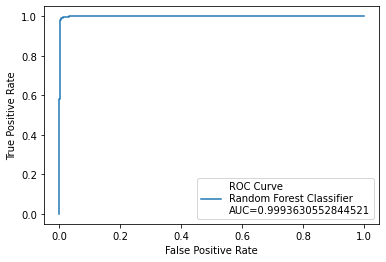

In [120]:
# Plots ROC curve along with AUC score

y_pred_proba = rf_clf_par.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_test,  y_pred_proba)
auc = metrics.roc_auc_score(Y_test, y_pred_proba)
plt.plot(fpr,tpr,label = "ROC Curve \nRandom Forest Classifier \nAUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

##### Saving the Best Model with pickel library 

In [122]:
with open("rf_clf_par.pkl", "wb") as f:
    pickle.dump(rf_clf_par, f)

In [124]:
model = pickle.load(open("rf_clf_par.pkl", "rb"))